## Dataset link and Ocr totorial

In [ ]:
# dataset path: https://universe.roboflow.com/malik-kashif-saeed-aswwf/pakistani-number-plates
# medium link: https://medium.com/@ashok.1055/automatic-number-plate-detection-using-yolov5-and-extraction-of-text-using-ocr-2868668aa479


## Repository Setup YoloV5

In [ ]:
%cd /content/
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt comet_ml  # install
import torch
import utils
display = utils.notebook_init()  # checks
%cd ..

YOLOv5 🚀 v7.0-356-g2070b303 Python-3.10.12 torch-2.3.1+cu121 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.7/107.7 GB disk)
/content


### Download Dataset (zip)

In [ ]:
!curl -L "https://universe.roboflow.com/ds/6DY94GLr1L?key=1QPaFIno6p" > vehicles.zip
# https://universe.roboflow.com/ds/6DY94GLr1L?key=1QPaFIno6p

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   910  100   910    0     0   1416      0 --:--:-- --:--:-- --:--:--  1417
100 37.0M  100 37.0M    0     0  8255k      0  0:00:04  0:00:04 --:--:-- 9823k


# **Create Directory and (unzip the dataset)**

---



In [ ]:
!mkdir vehicles_dataset
%cd vehicles_dataset
!unzip ../vehicles.zip
%cd ..

/content/vehicles_dataset
Archive:  ../vehicles.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/DSC_0329_jpg.rf.2b00cc6f37b895d6b8bbd28dd15589c7.jpg  
 extracting: test/images/DSC_0363_jpg.rf.108c80c04020f11aaf30f46108aaaf9a.jpg  
 extracting: test/images/DSC_0399_jpg.rf.4d72b21f60f7a5854dbc5a07e09137ad.jpg  
 extracting: test/images/DSC_0427_jpg.rf.9ca8a107b966c50b831e90e812289fef.jpg  
 extracting: test/images/DSC_0453_jpg.rf.4ad1d1aa1c6981fdfd75bd70e33f7e14.jpg  
 extracting: test/images/DSC_0550_jpg.rf.dbffa1faf2856044a38cccfa576318b0.jpg  
 extracting: test/images/DSC_0561_jpg.rf.9ddddb1e9a21e6cdbd79f9e1880cfd9a.jpg  
 extracting: test/images/DSC_0587_jpg.rf.36d91ea82485c1b1bff1ba3e53ab3071.jpg  
 extracting: test/images/DSC_0851_jpg.rf.9715eec7183d55d3785af7c5b596c0ec.jpg  
 extracting: test/images/DSC_0872_JPG.rf.2499cabc40b18c5341d9b7247ec9

In [ ]:
pwd

'/content'

In [ ]:
%cd yolov5

[Errno 2] No such file or directory: 'yolov5'
/content/drive/MyDrive/models


## inference with pre-trained Model

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source /content/vehicles_dataset/valid/images/DSC_0348_jpg.rf.e022bc55367cc855442d32e4f00d06c3.jpg

detect: weights=['yolov5s.pt'], source=/content/vehicles_dataset/valid/images/DSC_0348_jpg.rf.e022bc55367cc855442d32e4f00d06c3.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-354-gb86f316e Python-3.10.12 torch-2.3.1+cu121 CPU

100% 14.1M/14.1M [00:00<00:00, 210MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/1 /content/vehicles_dataset/valid/images/DSC_0348_jpg.rf.e022bc55367cc855442d32e4f00d06c3.jpg: 640x640 3 persons, 1 car, 1 traffic light, 708.7ms
Speed: 4.8ms pre-process, 708.7ms inference, 30.3ms NMS per image at shape (1, 3, 640, 640)
Results save

 .yaml File (Paths and class labels for custom dataset)

In [ ]:
yaml_content = """
train: ../vehicles_dataset/train/images
val: ../vehicles_dataset/valid/images
test: ../vehicles_dataset/test/images


nc: 1


names:
  0: 'Number-plate'


"""

# Save the content to a file
with open("vehicles.yaml", "w") as file:
    file.write(yaml_content)


### **Training**

In [ ]:
# !python train.py --img 640 --epochs 90 --data vehicles.yaml --weights yolov5s.pt

2024-08-19 12:26:07.913119: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-19 12:26:08.148733: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-19 12:26:08.221901: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=vehicles.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=90, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, o

## Mounting Google Drive in Google Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load trained Model on custom Data

In [ ]:
# Define the path to the saved model
# %cd /content/yolov5
# %pwd
# while loading present working directory must be /content/yolov5

import torch
model_path = '/content/drive/MyDrive/models/yolov5_model.pt'

# Load the model
model = torch.load(model_path)







In [ ]:
# torch.save(model, '/content/drive/MyDrive/models/yolov5_model.pt')

### **Save model on drive**

In [ ]:
# import os

# # Define the path to the folder
# save_folder = '/content/drive/MyDrive/models'

# # Create the folder if it doesn't exist
# os.makedirs(save_folder, exist_ok=True)

# # Define the full path to save the model
# save_path = os.path.join(save_folder, 'yolov5_model.pt')  # Change to .pt

# import torch

# # Path where the trained model is saved by YOLOv5
# trained_model_path = '/content/yolov5/runs/train/exp/weights/best.pt'


# # Save the entire model to the specified Google Drive path
# torch.save(torch.load(trained_model_path), save_path)




In [ ]:
# #  verify model is saved or not
# import torch

# # Load the model to verify it saved correctly
# loaded_model = torch.load(save_path)

# # Print model summary or check if loaded
# print(loaded_model)


{'epoch': -1, 'best_fitness': None, 'model': DetectionModel(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (2): C3(
      (cv1): Conv(
        (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (cv2): Conv(
        (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
  

In [ ]:
%pwd
%cd /content/yolov5

/content/yolov5


### Inferrence on the Test_data

In [ ]:
!python detect.py --weights /content/drive/MyDrive/models/yolov5_model.pt --img 640 --conf 0.25 --source /content/vehicles_dataset/test/images --name my_yolov5 --project /content/ouptuts

detect: weights=['/content/drive/MyDrive/models/yolov5_model.pt'], source=/content/vehicles_dataset/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=/content/ouptuts, name=my_yolov5, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-354-gb86f316e Python-3.10.12 torch-2.3.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
cropped_images/DSC_0329_jpg.rf.2b00cc6f37b895d6b8bbd28dd15589c7.jpg
image 1/34 /content/vehicles_dataset/test/images/DSC_0329_jpg.rf.2b00cc6f37b895d6b8bbd28dd15589c7.jpg: 640x640 1 Number-plate, 488.8ms
cropped_images/DSC_0363_jpg.rf.108c80c04020f11aaf30f46108aaaf9a.jpg
image 2/34 /content/vehicles_dataset/t

### **Output images of the Inferrence on the Test_data**

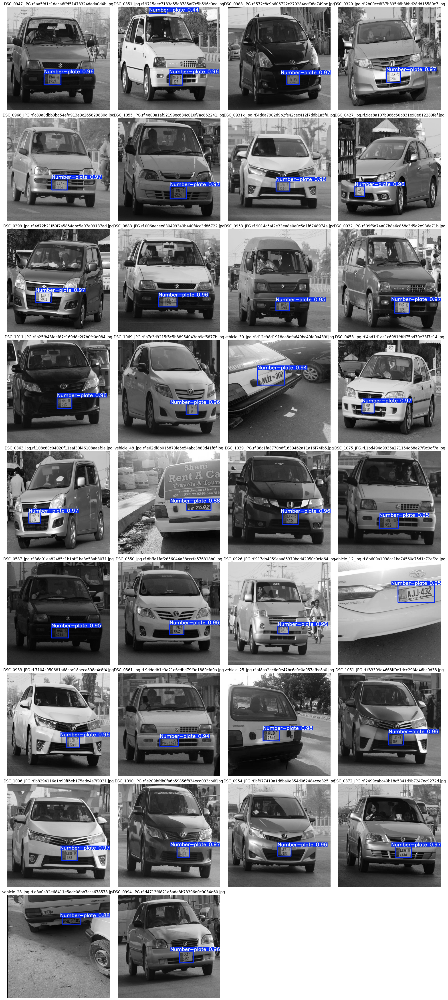

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

output_dir = '/content/ouptuts/my_yolov52'

# List all images in the output directory
output_images = [img for img in os.listdir(output_dir) if img.endswith('.jpg') or img.endswith('.png')]

# Number of images per row
images_per_row = 4

# Calculate the number of rows needed
num_rows = (len(output_images) + images_per_row - 1) // images_per_row

# Create a figure with a grid of subplots
plt.figure(figsize=(20, 5 * num_rows))

for i, image_name in enumerate(output_images):
    image_path = os.path.join(output_dir, image_name)

    # Load the image using OpenCV
    image = cv2.imread(image_path)

    # Convert BGR to RGB for Matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Calculate subplot index
    plt.subplot(num_rows, images_per_row, i + 1)
    plt.imshow(image_rgb)
    plt.title(image_name)
    plt.axis('off')  # Hide the axes

plt.tight_layout()
plt.show()


## **Cropped Images of Number plates**

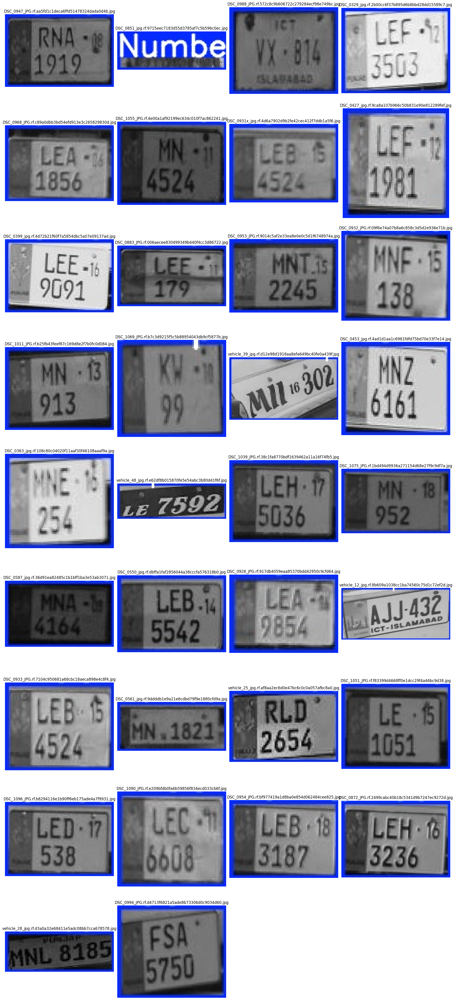

In [ ]:


output_dir = '/content/yolov5/cropped_images'

# List all images in the output directory
output_images = [img for img in os.listdir(output_dir) if img.endswith('.jpg') or img.endswith('.png')]

# Number of images per row
images_per_row = 4

# Calculate the number of rows needed
num_rows = (len(output_images) + images_per_row - 1) // images_per_row

# Create a figure with a grid of subplots
plt.figure(figsize=(20, 5 * num_rows))

for i, image_name in enumerate(output_images):
    image_path = os.path.join(output_dir, image_name)

    # Load the image using OpenCV
    image = cv2.imread(image_path)

    # Convert BGR to RGB for Matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Calculate subplot index
    plt.subplot(num_rows, images_per_row, i + 1)
    plt.imshow(image_rgb)
    plt.title(image_name)
    plt.axis('off')  # Hide the axes

plt.tight_layout()
plt.show()


In [ ]:
!pip install easyocr
import easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 38.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.3/281.3 kB 16.2 MB/s eta 0:00:00


## Image to Text (Using EASYOCR)

In [ ]:
# Step 2: Perform OCR using EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext('/content/yolov5/cropped_images/DSC_0427_jpg.rf.9ca8a107b966c50b831e90e812289fef.jpg')

# Step 3: Print the extracted text
print("Extracted Text:")
for (_, text, _) in result:
    print(text)



Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% CompleteExtracted Text:
Lef
1981


### Add this snippet into detect.py file to crop the number plate images


In [ ]:

# import os
# import cv2
# import numpy as np

# # Ensure the output directory exists
# output_dir = 'cropped_images/'
# if not os.path.exists(output_dir):
#     os.makedirs(output_dir)

# save_obj = True
# if save_obj:
#     if int(cls) == 0:
#         for k in range(len(det)):
#             xyxy = det[k][:4]  # Assuming det[k] contains bounding box coordinates
#             x, y, w, h = int(xyxy[0]), int(xyxy[1]), int(xyxy[2] - xyxy[0]), int(xyxy[3] - xyxy[1])
#             img_ = im0.astype(np.uint8)
#             crop_img = img_[y:y + h, x:x + w]

#             # Rescale image if needed
#             # (Add any rescaling code here if necessary)

#             filename = p.name  # Ensure `p.name` is defined in your context
#             filepath = os.path.join(output_dir, filename)
#             print(filepath)
#             cv2.imwrite(filepath, crop_img)
#     else:
#         print("There is no detected object")
#         continue
